# Preference learning for wine quality dataset
* Sebastian Chwilczynski 148248
* Karol Cyganik 148250
## Data analysis

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = pd.read_csv('WineQT.csv', index_col=-1)
df.head()


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
Id,,,,,,,,,,,,
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [3]:
from ydata_profiling import ProfileReport

ProfileReport(df)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Dataset description

This datasets contains information about Portuguese "Vinho Verde" red wine. The dataset describes the amount of various chemicals present in wine and their effect on it's quality. [Kaggle](https://www.kaggle.com/datasets/yasserh/wine-quality-dataset)

Each sample is characterized by 11 input variables and one output variable (quality). The input variables are based on physicochemical tests and the output variable is based on sensory data.:

1. **Fixed acidity** - refers to the concentration of non-volatile acids in wine, primarily tartaric acid. It gives the wine a tart or sour taste and is an important factor in determining the overall balance of the wine
2. **Volatile acidity** - concentration of volatile acids in wine, primarily acetic acid. It can give wine a vinegar-like taste and aroma and is generally considered a fault in wine
3. **Citric acid** - weak organic acid found in small amounts in some wines. It can contribute to the overall acidity and freshness of the wine
4. **Residual sugar** -  amount of sugar left in the wine after fermentation. It can contribute to the sweetness and body of the wine
5. **Chlorides** - concentration of salt in the wine. High levels of chloride can contribute to a salty taste and are generally considered a fault in wine
6. **Free sulfur dioxide** -  preservative that is added to wine to prevent spoilage from bacteria and oxidation. It can also contribute to the wine's aroma
7. **Total sulfur dioxide** - sum of free and bound sulfur dioxide in the wine. Bound sulfur dioxide is the portion that has combined with other components in the wine and is not immediately available as a preservative.
8. **Density** -  mass of the wine per unit of volume. It can be used to estimate the alcohol content of the wine
9. **pH** - measure of the acidity or basicity of the wine. Lower pH values indicate higher acidity
10. **Sulphates** -  type of salt that is added to wine as a preservative. They can also contribute to the wine's aroma and taste
11. **Alcohol** - amount of ethanol in the wine. It can contribute to the wine's body, sweetness, and overall balance

The output variable is the quality of the wine, on a scale from 0 to 10. However here we will only consider two classes: good (quality > 5) and bad (quality <= 5).

### Data analysis

- The dataset doesn't contain any missing values, but it hase 114 (~10%) of duplicates. We decided to keep them, as they might give some additional information about the data (e.g. in case of distribution)

- Quality, pH, density seem to follow normal distribution

- Fixed acidity, residual sugars, chlorides, sulpahates has distribution that in most cases look like the normal distribution with very long tails. The long tails look like they were outliers, but we don't want to remove them, as they might be important for the model as we're not sure of their origin.

- Other column's distributions don't look strange, but they are not normal. Also, we don't see any significant outliers in them.

- The data seems to be balanced enough. The only column that takes correlation values around (-)0.7 is the fixed acidity (with citric acid, density and pH). **Warning** - those correlation values might have impact on partial dependence plot, as PDP assumes that the features are independent.


In [4]:
df['score'] = df['quality'].apply(lambda x: 'good' if x > 5 else 'bad')
df.drop('quality', axis=1, inplace=True)


In [5]:
df.head()


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,score
Id,,,,,,,,,,,,
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,bad
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,bad
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,bad
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,good
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,bad


In [6]:
df.to_csv('WineQT_cleaned.csv')


## First model - XGBoost

### Data preparation

In [7]:
from xgboost import XGBClassifier
import xgboost as xgb
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import cross_val_score
from xgboost import plot_tree

df = pd.read_csv('WineQT_cleaned.csv', index_col=0)
X = df.drop('score', axis=1)
y = LabelEncoder().fit_transform(df['score'])


In [8]:
features = X.columns


### Features monotonicity

To have some knowledge about the monotonicity of the function w.r.t. attributes we decided to train simple linear regressor and infer monotonicity of attributes based on coefficiants.

In [9]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler

lr = LinearRegression()
lr.fit(StandardScaler().fit_transform(X), y)

lr.coef_


array([ 0.04899647, -0.11290451, -0.05419016, -0.00195238, -0.02468921,
        0.03214174, -0.08555467, -0.00207819, -0.00202519,  0.08861383,
        0.17669797])

In [10]:
monotone_constraints = ['1' if coef > 0 else '-1' for coef in lr.coef_]


In [11]:
constraints = pd.DataFrame(df.columns[:-1], columns=['features'])
constraints['monotonicity'] = ["increasing" if m_c ==
                               '1' else "decreasing" for m_c in monotone_constraints]
constraints

,features,monotonicity
0,fixed acidity,increasing
1,volatile acidity,decreasing
2,citric acid,decreasing
3,residual sugar,decreasing
4,chlorides,decreasing
5,free sulfur dioxide,increasing
6,total sulfur dioxide,decreasing
7,density,decreasing
8,pH,decreasing
9,sulphates,increasing


### Model training

At the very beginning let's just quickly see what we can obtain by not restricting. We also use XGB Classifier.

In [12]:
def cross_validate_the_model(model, X, y):
    acc = cross_val_score(model, X, y, cv=10, scoring='accuracy').mean()
    auc = cross_val_score(model, X, y, cv=10, scoring='roc_auc').mean()
    f1 = cross_val_score(model, X, y, cv=10, scoring='f1').mean()

    print(
        f"Model: {model.__class__.__name__}, obtained ACC: {acc}, AUC: {auc}, F1: {f1}")

In [13]:
model = XGBClassifier(**{
    "max_depth": 20,
    "eval_metric": "rmse",
    "n_estimators": 50,
})
cross_validate_the_model(model, X, y)


Model: XGBClassifier, obtained ACC: 0.7174599542334096, AUC: 0.7856731893250457, F1: 0.7320999370241468


Now let's try to create as simple model and as good as possible. We did many trials on setting this hyperparameters to obtain as simple tree. This is what we got.

In [14]:
params = {
    "max_depth": 3,
    "eta": 0.1,
    "nthread": 2,
    "seed": 0,
    "eval_metric": "rmse",
    "monotone_constraints": "(" + ",".join(monotone_constraints) + ")",
    "n_estimators": 1,
    # "max_leaves": 6, # I added this as it shouldn't lead to performance deterioration looking on yielded tree and we have smaller tree,
    # However exact method doesn't care about thi max_leaves.
    # "tree_method": "hist", #But after adding this I still have one reduntant branch
    "gamma": 20,  # After some fight I was able to find this parameter useful :D to obtain wanted tree,
}

In [15]:
model = XGBClassifier(**params)
cross_validate_the_model(model, X, y)
model = model.fit(X, y)  # We use CV so we can fit on whole data

Model: XGBClassifier, obtained ACC: 0.6763081617086193, AUC: 0.7367224756375699, F1: 0.7241161201450719


Probably analysis should be deeper. But at the first glance it looks like we didn't loose too much.

### Model explaination

In [16]:
booster = model.get_booster()
booster.feature_names = list(features)


<AxesSubplot: >

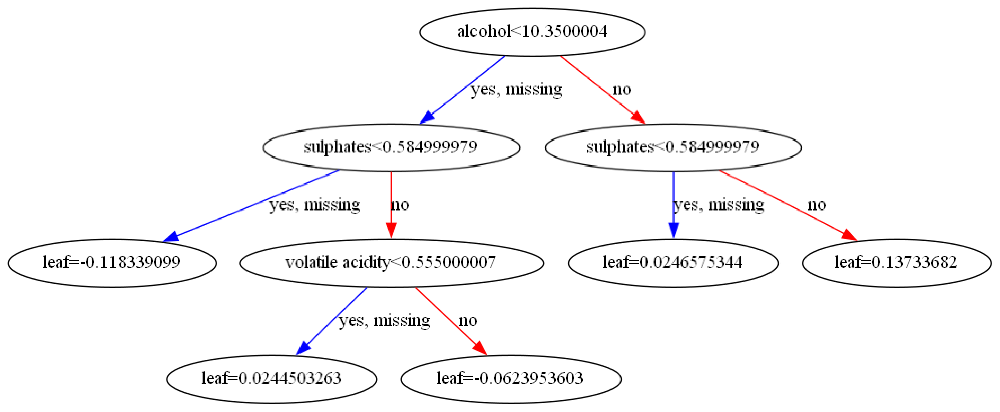

In [17]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(40, 20))
plot_tree(model, ax=ax, num_trees=0)


This is the simplest tree we could get. Still the split at the second level on the same value of sulphates looks a little bit suspicious. 
We can very easily read 4 decision rules for the classification:
1. if alcohol < 10.35 and sulphates < 0.58 then bad
2. if alcohol < 10.35 and sulphates >= 0.58 and volatile acidity < 0.55 then good
3. if alcohol < 10.35 and sulphates >= 0.58 and volatile acidity >= 0.55 then bad
4. if alcohol >= 10.35 then good (the next split is redundant but we couldn't get rid off it)

Features importance: ([source](https://github.com/dmlc/xgboost/blob/master/python-package/xgboost/core.py#L2583))

In [18]:
def explainable_plot(dict_to_plot, title):
    plt.figure(figsize=(10, 5))
    plt.barh(list(dict_to_plot.keys()), list(
        dict_to_plot.values()), height=0.3)
    plt.title(title, fontsize=15)
    plt.yticks(fontsize=15)
    plt.xticks(fontsize=15)
    plt.tight_layout()
    plt.show()

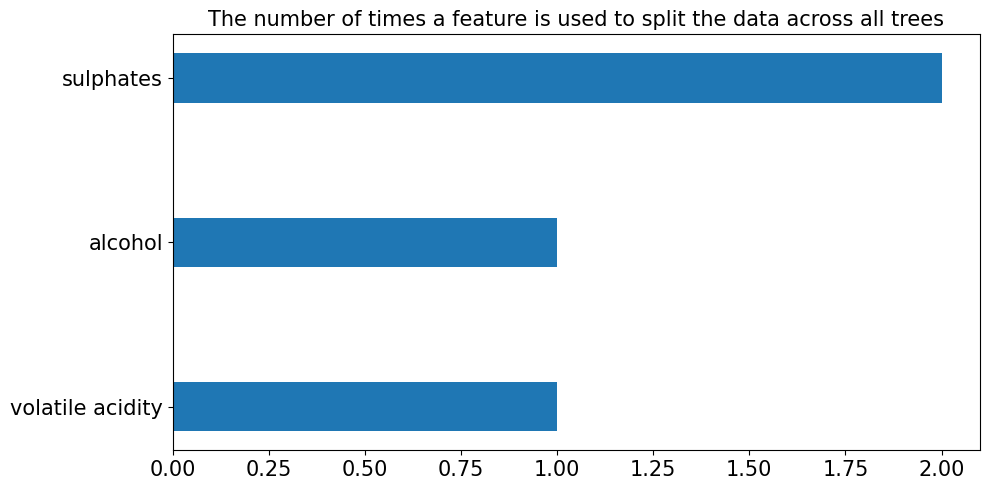

In [19]:
fscores = booster.get_fscore()
fscores = {k: v for k, v in sorted(fscores.items(), key=lambda item: item[1])}
explainable_plot(
    fscores, "The number of times a feature is used to split the data across all trees")

From here we see sulphates was used twice. However, by inspecting the three we may by suspicious about it's importance. As one split with it is not necessary

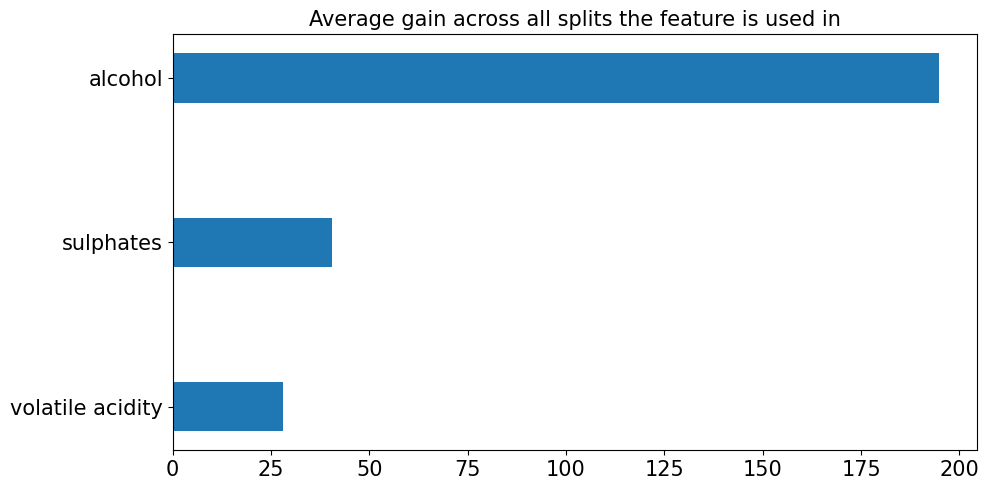

In [20]:
score = booster.get_score(importance_type='gain')
score = {k: v for k, v in sorted(score.items(), key=lambda item: item[1])}
explainable_plot(
    score, "Average gain across all splits the feature is used in")

And this indeed shows that the alcohol is most important attribute

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


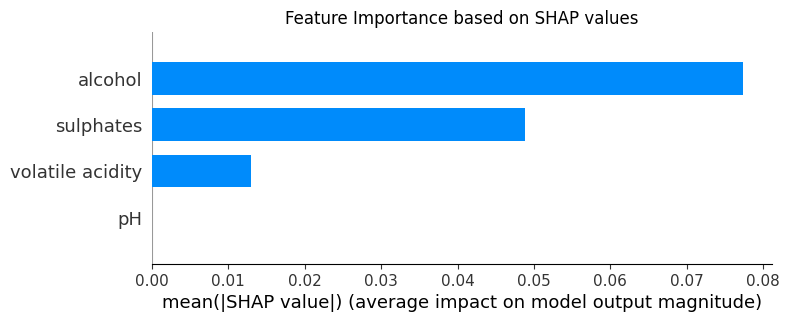

In [21]:
import shap

shap.initjs()
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)
shap.summary_plot(shap_values, X, plot_type="bar",
                  feature_names=features, show=False, max_display=4)
plt.title("Feature Importance based on SHAP values")
plt.show()


Same results based on the SHAP values. Generally based on this preferences user prefer more alcohol in wine. Most of the criteria has rather limited effect (even if they have it can't be taken into account with such a small model). Preference threshold in this case can be easily decuded from inferred decision rules.


Let's draw PDP's just for the important attributes

In [22]:
IMPORTANT_ATTRIBUTES = ["alcohol", "sulphates", "volatile acidity"]


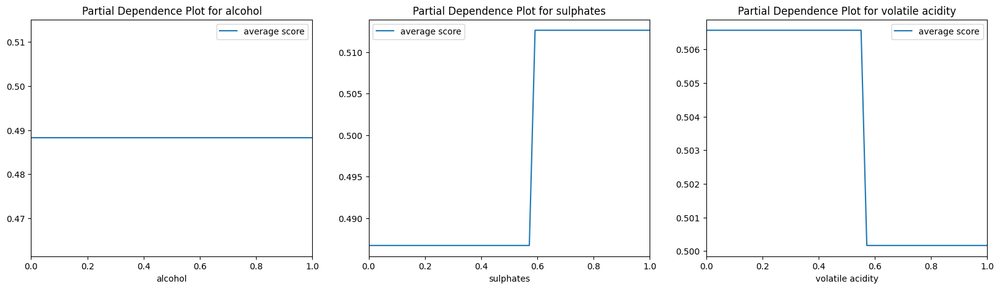

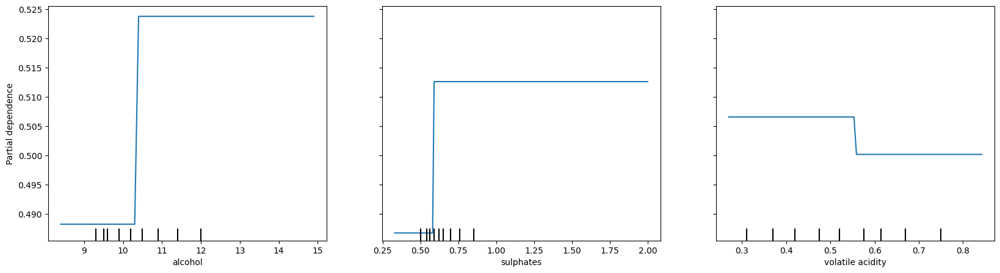

In [23]:
from sklearn.inspection import PartialDependenceDisplay


def plot_PDP(booster, X):
    grid = np.linspace(0, 1, 50)
    fig, ax = plt.subplots(1, 3, figsize=(20, 5))
    features = X.columns
    for plt_i, attrib in enumerate(IMPORTANT_ATTRIBUTES):
        c = X.columns.get_loc(attrib)
        y_pred = np.zeros(len(grid))
        for i, val in enumerate(grid):
            X_temp = X.values.copy()
            X_temp[:, c] = val
            data = xgb.DMatrix(pd.DataFrame(X_temp), feature_names=features)
            y_pred[i] = np.average(booster.predict(data))

        ax[plt_i].plot(grid, y_pred,  label='average score')
        ax[plt_i].set_xlim(0, 1)
        ax[plt_i].set_xlabel(features[c])
        ax[plt_i].title.set_text('Partial Dependence Plot for ' + features[c])
        ax[plt_i].legend()


plot_PDP(booster, X)
plt.rcParams["figure.figsize"] = (20, 5)
PartialDependenceDisplay.from_estimator(
    model, X, features=[X.columns.get_loc(attr) for attr in IMPORTANT_ATTRIBUTES])

Probably the difference in obtaining expected value is the reason of different results using PDP from sklearn alcohol seems to be the most important and changes score the most.

 Let's train the model on just the important attributes and see if the PDP changes.

In [24]:
# Alcohol increasing, sulphates increasing and volatile acidity decreasing
params['monotone_constraints'] = "(1,1,-1)"
model = XGBClassifier(**params)
X_important = X[IMPORTANT_ATTRIBUTES]
cross_validate_the_model(model, X_important, y)
model = model.fit(X_important, y)

Model: XGBClassifier, obtained ACC: 0.6624103737604882, AUC: 0.7330829091784661, F1: 0.6981897047989019


<AxesSubplot: >

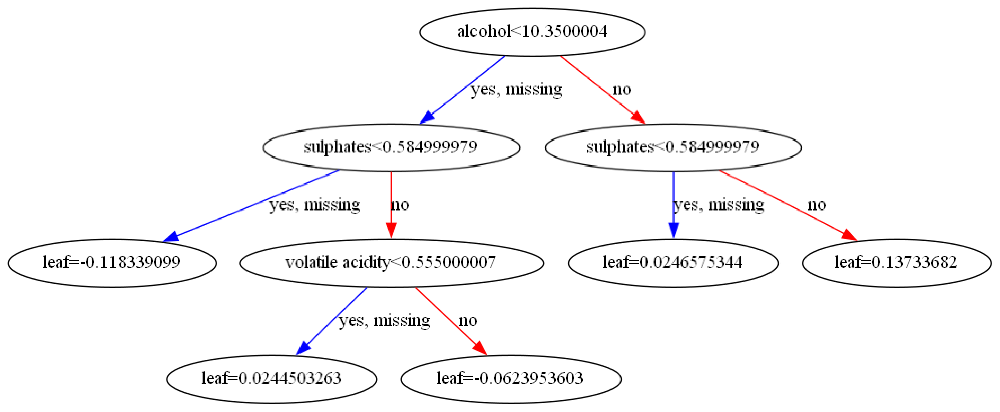

In [25]:
%matplotlib inline
booster = model.get_booster()
fig, ax = plt.subplots(figsize=(40, 20))
plot_tree(model, ax=ax, num_trees=0)


We obtained exactly the same tree, which was expected.

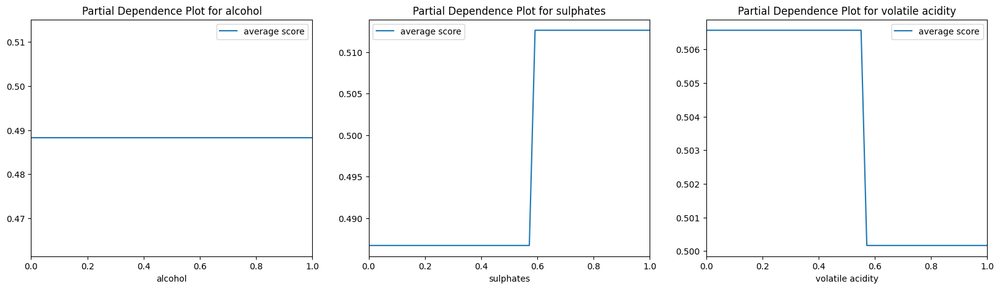

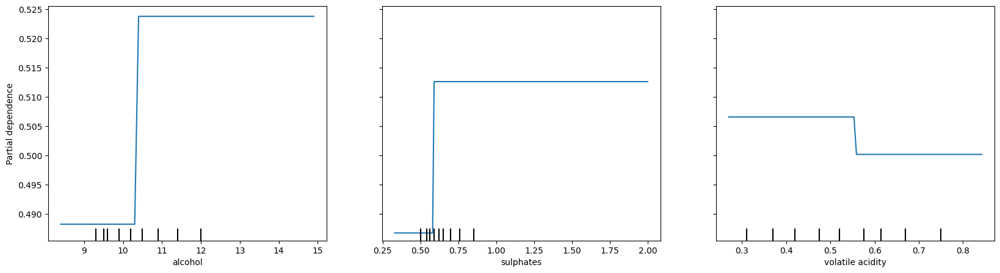

In [26]:
plot_PDP(booster, X_important)
plt.rcParams["figure.figsize"] = (20, 5)
PartialDependenceDisplay.from_estimator(model, X_important, features=[0, 1, 2])

And also the same PDP's again as expected. So probably we can remove all unused attributes. For the rest of the models we will test both full set and those indicated by XGBoost. Finally, we can also see that monotonicity constraints indeed holds.

### Analytical 3 samples explanation

For the sake of clearness we use just important features

In [27]:
samples = X_important.sample(3, random_state=42)
samples


,alcohol,sulphates,volatile acidity
Id,,,
222,9.500000,0.60,0.61
1514,9.233333,0.72,0.84
417,10.500000,0.48,0.58


In [28]:
pred = model.predict(samples)
pred  # bad, bad, good

array([0, 0, 1])

Analytical (kind of) solution. Let's recall our decision rules

1. if alcohol < 10.35 and sulphates < 0.58 then bad
2. if alcohol < 10.35 and sulphates >= 0.58 and volatile acidity < 0.55 then good
3. if alcohol < 10.35 and sulphates >= 0.58 and volatile acidity >= 0.55 then bad
4. if alcohol >= 10.35 then good (the next split is redundant but we couldn't get rid off it)

example 1
* alcohol = 9.500000
* sulphates = 0.60
* volatile_acidity = 0.61

We have two potential options to change this wine to good class. These are called conterfactuals. We may show them to the DM to decide what to do.

1. increase alcohol by at least 0.85
2. decrease volatile acidity by at leat 0.06

In [29]:
sample1 = samples.iloc[0, :]
print(model.predict(sample1.values.reshape(1, -1))[0])
# Increase in alchohol not big enough
print(model.predict((sample1 + [0.84, 0, 0,]).values.reshape(1, -1))[0])
# Increase in alchohol big enough
print(model.predict((sample1 + [0.85, 0, 0,]).values.reshape(1, -1))[0])
# Decrease in volatilee acidity big enough
print(model.predict((sample1 + [0, 0, -0.06]).values.reshape(1, -1))[0])

0
0
1
1


So as one can see this model is trivial concerning it's explanations, every DM should easily comprehend it. Same procedure can be repeated for the rest of the examples. I think sampling of the space of examples is completely not necessary in this case as we see clearly that this analytic approach works.

In [30]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(samples)


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


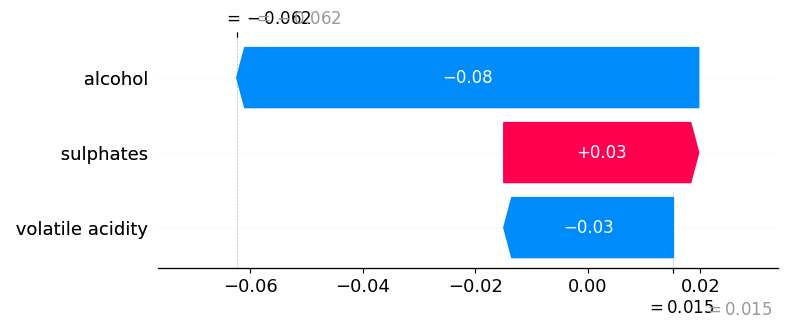

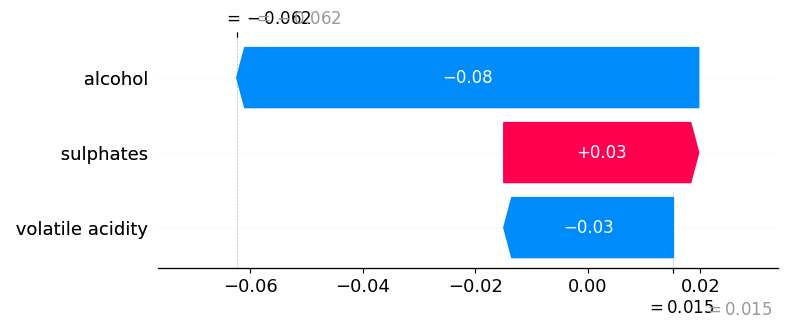

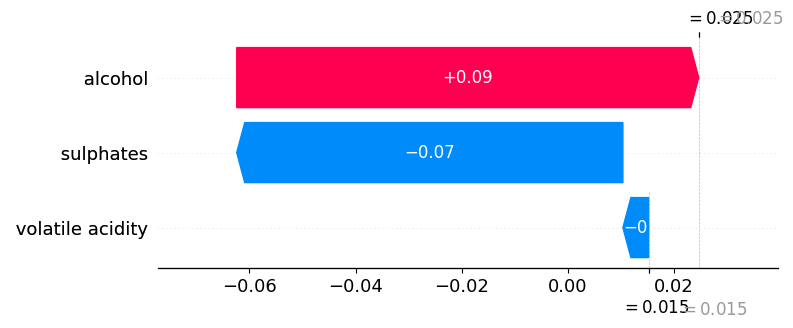

In [31]:
for i in range(len(samples)):
    shap.plots._waterfall.waterfall_legacy(
        explainer.expected_value, shap_values[i, :], samples.iloc[i, :], feature_names=IMPORTANT_ATTRIBUTES, max_display=5)

## ANN Choquet integral

In this particular case it seems the more attributes we have the more messy explanations will be. So At the very beginning we test whether keeping just important attributes is enough if it is we stick to them.

### Model definition

In [32]:
import torch.nn as nn
import torch
import torch.nn.functional as F
from helpers import *


class LinearGreaterThanZero(nn.Linear):
    def __init__(self, in_features, bias=False, min_w=0.0000001):
        super().__init__(in_features, 1, bias)
        self.is_bias = bias
        self.min_w = min_w
        if bias:
            nn.init.uniform_(self.bias, self.min_w, 1.0)
        else:
            self.bias = None

    def reset_parameters(self):
        nn.init.uniform_(self.weight, 0.1, 1.0)

    def w(self):
        with torch.no_grad():
            self.weight.data[self.weight.data < 0] = self.min_w
        return self.weight

    def forward(self, input):
        return F.linear(input, self.w(), self.bias)


class LinearInteraction(nn.Linear):
    def __init__(self, in_features, criterion_layer):
        super().__init__(((in_features - 1) * in_features) // 2, 1, False)
        self.in_features = in_features
        self.criterion_layer = criterion_layer

    def reset_parameters(self):
        nn.init.normal_(self.weight, 0.0, 0.1)

    def w(self):
        with torch.no_grad():
            w_i = 0
            w = self.criterion_layer.w()
            for i in range(self.in_features):
                for j in range(i + 1, self.in_features):
                    self.weight.data[:, w_i] = torch.max(
                        self.weight.data[:, w_i], -w[:, i]
                    )
                    self.weight.data[:, w_i] = torch.max(
                        self.weight.data[:, w_i], -w[:, j]
                    )
                    w_i += 1
        return self.weight

    def forward(self, input):
        return F.linear(input, self.w(), None)


class ThresholdLayer(nn.Module):
    def __init__(self, threshold=None, requires_grad=True):
        super().__init__()
        if threshold is None:
            self.threshold = nn.Parameter(
                torch.FloatTensor(1).uniform_(0.1, 0.5), requires_grad=requires_grad
            )
        else:
            self.threshold = nn.Parameter(
                torch.FloatTensor([threshold]), requires_grad=requires_grad
            )

    def forward(self, x):
        return x - self.threshold


class ChoquetConstrained(nn.Module):
    def __init__(self, criteria_nr, **kwargs):
        super().__init__()
        self.criteria_nr = criteria_nr
        self.criteria_layer = LinearGreaterThanZero(criteria_nr)
        self.interaction_layer = LinearInteraction(
            criteria_nr, self.criteria_layer)
        self.thresholdLayer = ThresholdLayer()

    def forward(self, x):
        if len(x.shape) == 3:
            x = x[:, 0, :]
        x_wi = self.criteria_layer(x[:, : self.criteria_nr])
        x_wij = self.interaction_layer(x[:, self.criteria_nr:])
        weight_sum = self.criteria_layer.w().sum() + self.interaction_layer.w().sum()
        score = (x_wi + x_wij) / (weight_sum)
        return self.thresholdLayer(score)


def mobious_transform(row):
    return list(row) + [
        min(row[i], row[j]) for i in range(len(row)) for j in range(i + 1, len(row))
    ]

### Data preparation

In [63]:
# For chocquet min_max_scaling seems most reasonable. Otherwsie our weights can potentially misled us.
from sklearn.preprocessing import MinMaxScaler

df = pd.read_csv('WineQT_cleaned.csv', index_col=0)
X = df.drop('score', axis=1)
X = pd.DataFrame(MinMaxScaler().fit_transform(X), columns=X.columns)
X_important = X[IMPORTANT_ATTRIBUTES]
y = LabelEncoder().fit_transform(df['score'])

In [64]:
PATH = "choquet.pt"


### Model training

All features vs just important ones

In [65]:
from sklearn.model_selection import KFold


def cross_validate_choquet(X, y):
    kf = KFold(n_splits=10)

    data_input = X.apply(
        lambda x: mobious_transform(x), axis=1, result_type="expand"
    )

    accuracies = []
    aucs = []

    for i, (train_index, test_index) in enumerate(kf.split(data_input)):
        X_train, X_test, y_train, y_test = data_input.iloc[
            train_index], data_input.iloc[test_index], y[train_index], y[test_index]

        train_dataloader = CreateDataLoader(X_train.values, y_train)
        test_dataloader = CreateDataLoader(X_test.values, y_test)

        model = ChoquetConstrained(len(X.columns))

        acc, acc_test, auc, auc_test = Train(
            model, train_dataloader, test_dataloader, PATH)

        accuracies.append(acc_test)
        aucs.append(auc_test)

    accuracies = np.array(accuracies)
    aucs = np.array(aucs)
    print(f"Accuracy: {accuracies.mean()} +/- {accuracies.std()}")
    print(f"AUC: {aucs.mean()} +/- {aucs.std()}")

In [66]:
cross_validate_choquet(X, y)

100%|██████████| 200/200 [00:19<00:00, 10.48it/s]

Accuracy: 0.5214340198321892 +/- 0.10536393985933756
AUC: 0.5635372236361602 +/- 0.09204286573336128


The variance in the case of using all attributes is very big almost 9%! With such small level of accuracy and AUC this seems very risky to introduce this model.

In [37]:
cross_validate_choquet(X_important, y)

100%|██████████| 200/200 [00:15<00:00, 12.99it/s]

Accuracy: 0.6196414950419527 +/- 0.08488676681837366
AUC: 0.6461734903883005 +/- 0.09056665019393105


Variance is still big. However the results are better. Moreover such a model will be better explainable. So we stick with smaller one for our final model.

In [38]:
data_input = X_important.apply(
    lambda x: mobious_transform(x), axis=1, result_type="expand")

train_dataloader = CreateDataLoader(data_input.values, y)
test_dataloader = CreateDataLoader(data_input.values, y)

model = ChoquetConstrained(len(X_important.columns))

acc, acc_test, auc, auc_test = Train(
    model, train_dataloader, test_dataloader, PATH)
print(f"Final Accuracy: {acc}, Final AUC: {auc}")

100%|██████████| 200/200 [00:19<00:00, 10.01it/s]

Final Accuracy: 0.7077865266841645, Final AUC: 0.7514313830738951


Lets see the weights and shapley values. We load previosuly trained model so that nothing will change.

In [39]:
model.load_state_dict(torch.load("final_choquet.pt")["model_state_dict"])


<All keys matched successfully>

In [40]:
criteria_nr = len(X_important.columns)
weights = model.criteria_layer.w().detach().numpy()[0]
interaction_weights = model.interaction_layer.w().detach().numpy()[0]
s = weights.sum() + interaction_weights.sum()
weights = weights / s
interaction_weights = interaction_weights / s

interactions = np.zeros((criteria_nr, criteria_nr))
weight_id = 0
for i in range(criteria_nr):
    for j in range(i + 1, criteria_nr):
        interactions[i, j] = interactions[j,
                                          i] = interaction_weights[weight_id]
        weight_id += 1

In [41]:
print("Criteria weights:")
pd.DataFrame([weights], columns=X_important.columns)


Criteria weights:


,alcohol,sulphates,volatile acidity
0,0.163664,0.272885,0.300841


In [42]:
print("Criteria interactions:")
pd.DataFrame(interactions, columns=X_important.columns,
             index=X_important.columns)

Criteria interactions:


,alcohol,sulphates,volatile acidity
alcohol,0.00000,0.076710,0.043830
sulphates,0.07671,0.000000,0.142069
volatile acidity,0.04383,0.142069,0.000000


Before MinMax Scaling alcohol had the smallest weight. However, it had also the biggest scale. So the compensation was clearly shown here.

After the min-max scaling results are very interesting The biggest influence is not given to the alcohol

In [43]:
shapley = weights + interactions.sum(0) / 2
print("Importance of criterina (Shapley value):")
pd.DataFrame([shapley], columns=X_important.columns)


Importance of criterina (Shapley value):


,alcohol,sulphates,volatile acidity
0,0.223935,0.382275,0.39379


And shapley values confirms this. So for this method sulphates and volatile acidity Are the most important attributes. Alcohol still has influence but not as big as in the case of XGBoost.

Finally what is the threshold value?

In [44]:
model.thresholdLayer.threshold


Parameter containing:
tensor([0.2164], requires_grad=True)

### Model explaination

Analytical answer:

Having all parameters and a threshold we can easily reproduce the original equation. Let *alcohol=x1*, *sulphates=x2* and *volatile acidity=x3*. Then we have:

$C(x) = 0.16*x1 + 0.27*x2 + 0.3*x3 + 0.08 * min(x1,x2) + 0.04 * min(x1,x3) + 0.14 * min(x2,x3)$

and the classification is done by thresholding

`if` $C(x) - 0.2164 >= 0 =>$ good  `else` bad 

Now let's take the same example as for XGBoost (features are scaled now)

example 1
* alcohol = 9.500000 -> 0.169231
* sulphates = 0.60 -> 0.161677
* volatile_acidity = 0.61 -> 0.335616

C(x) - threshold $\approx$ -0.0009 so the clas is `bad`. So the margin for this example is very small. We can solve analytically what change is necessary to change the decision:
* We can increase $x3$ by $0.0009/0.3 \approx 0.003$
* We can increase $x2$ by $0.0009/(0.4+0.36) \approx 0.002$

Again we can show such conterfactuals to our DM and they can make a decisision which one to choose. `Moreover we must be very careful about this interaction terms as we create counterfactuals`

In [45]:
samples = data_input.sample(3, random_state=42)
samples


,0,1,2,3,4,5
158,0.169231,0.161677,0.335616,0.161677,0.169231,0.161677
1081,0.128205,0.233533,0.493151,0.128205,0.128205,0.233533
291,0.323077,0.089820,0.315068,0.089820,0.315068,0.089820


In [46]:
# Original sample, negative class
print(model.forward(torch.Tensor(samples.iloc[0].values).unsqueeze(0)))
# To small change still negative
print(model.forward(torch.Tensor(
    (samples.iloc[0] + [0, 0, 0.002, 0, 0, 0]).values).unsqueeze(0)))
# Change big enough to make it positive
print(model.forward(torch.Tensor(
    (samples.iloc[0] + [0, 0, 0.0035, 0, 0, 0]).values).unsqueeze(0)))
# To small change still negative
print(model.forward(torch.Tensor(
    (samples.iloc[0] + [0, 0.001, 0.0, 0.001, 0, 0.001]).values).unsqueeze(0)))
# Change big enough to make it positive
print(model.forward(torch.Tensor(
    (samples.iloc[0] + [0, 0.002, 0.0, 0.002, 0, 0.002]).values).unsqueeze(0)))

tensor([[-0.0009]], grad_fn=<SubBackward0>)
tensor([[-0.0003]], grad_fn=<SubBackward0>)
tensor([[0.0002]], grad_fn=<SubBackward0>)
tensor([[-0.0004]], grad_fn=<SubBackward0>)
tensor([[0.0001]], grad_fn=<SubBackward0>)


For 3 other alternatives we can do same steps.

Now the question is whether we need anything more concerning explainability? We can very easily provide conterfactuals. We thinks this is enough. Again sampling within the sample space is not necessary as we already have strict mathematical formula that is very easy to comprehend.

## MLP

### Data preparation

In [47]:
df = pd.read_csv('WineQT_cleaned.csv', index_col=0)
X = df.drop('score', axis=1)
X = pd.DataFrame(StandardScaler().fit_transform(
    X), columns=X.columns)  # For neural network we need this
X_important = X[IMPORTANT_ATTRIBUTES]
y = LabelEncoder().fit_transform(df['score'])

### Model training

We compare score with all features and just important

In [48]:
from sklearn.neural_network import MLPClassifier
import warnings
warnings.filterwarnings("ignore")
mlp = MLPClassifier(hidden_layer_sizes=(100, 32), max_iter=100, alpha=0.01,
                    solver='sgd', random_state=1234)  # It cries about not converging, but the changes are very small if we let train for longer
cross_validate_the_model(mlp, X, y)

Model: MLPClassifier, obtained ACC: 0.7340122044241036, AUC: 0.8002727187602418, F1: 0.7394213626775226


In [49]:
from sklearn.neural_network import MLPClassifier
mlp = MLPClassifier(hidden_layer_sizes=(100, 32), max_iter=100, alpha=0.01,
                    solver='sgd', random_state=1234)
cross_validate_the_model(mlp, X_important, y)

Model: MLPClassifier, obtained ACC: 0.733996948893974, AUC: 0.8216437979752038, F1: 0.7427445356960136


In [50]:
mlp.fit(X_important, y)


MLPClassifier(alpha=0.01, hidden_layer_sizes=(100, 32), max_iter=100,
              random_state=1234, solver='sgd')

So as we can see again giving just the important attributes to the model is enough.

### Model explaination
Using SHAP [KernelExplainer](https://shap-lrjball.readthedocs.io/en/latest/example_notebooks/kernel_explainer/Census%20income%20classification%20with%20Keras.html)

In [51]:
import shap

explainer = shap.KernelExplainer(mlp.predict_proba, X_important[:50])
shap_values = explainer.shap_values(X_important, nsamples=100)

  0%|          | 0/1143 [00:00<?, ?it/s]

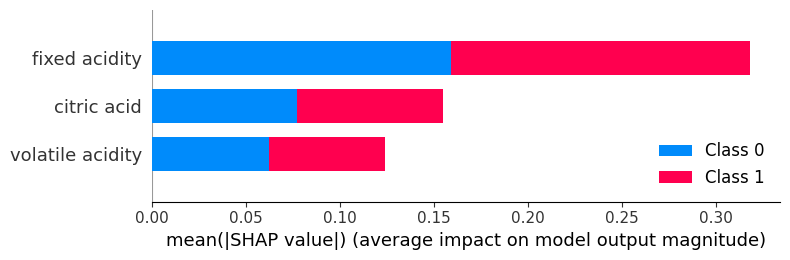

In [52]:
shap.summary_plot(shap_values, X_important,
                  plot_type="bar", feature_names=X.columns)

### 3 samples explanation

Analytical explanation in this case is very difficult. We can use some gradient methods to create conterfactuals but still these are created based on some iterative procedure not analytical one. So we consider SHAP values as being enough

In [59]:
np.random.seed(52)
samples = X_important.iloc[np.random.choice(
    X_important.shape[0], 3, replace=False)]
samples

,alcohol,sulphates,volatile acidity
204,-0.131375,0.600574,-0.453002
1048,1.994864,-0.808504,0.939332
681,-1.148272,-1.043350,0.716559


In [60]:
pred = mlp.predict(samples)
pred


array([1, 1, 0])

In [61]:
shap_values = [explainer.shap_values(samples.iloc[i])
               for i in range(len(samples))]

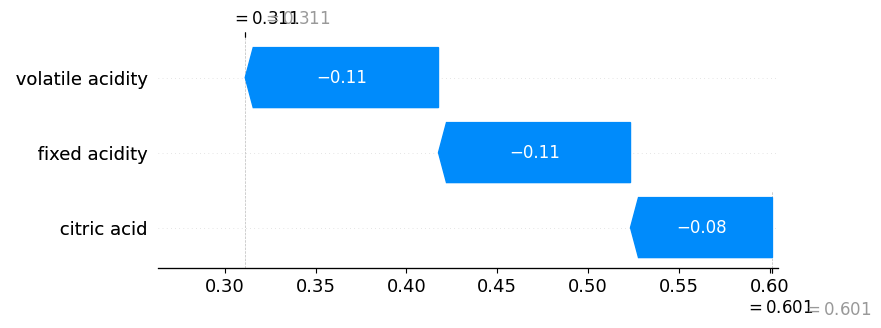

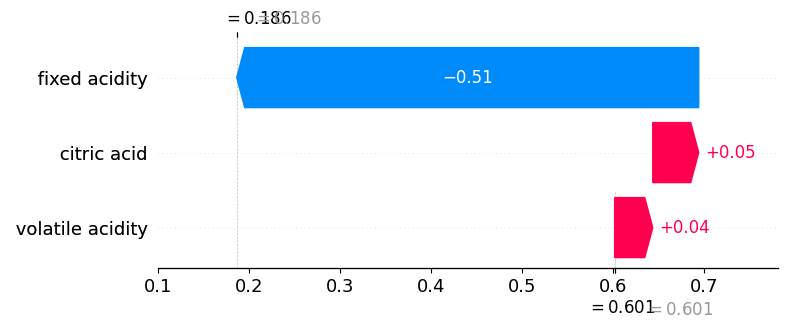

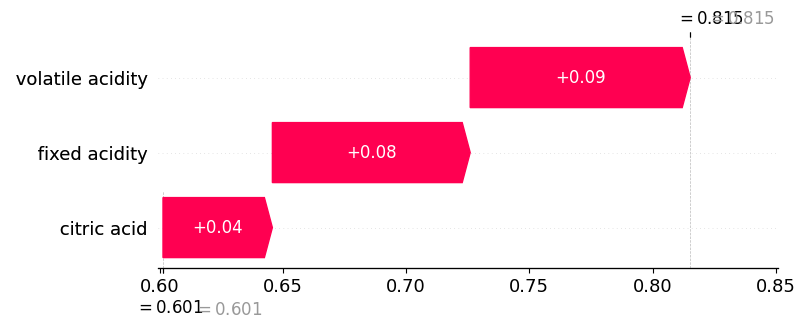

In [62]:
for i in range(len(samples)):
    shap.plots._waterfall.waterfall_legacy(
        explainer.expected_value[0], shap_values[i][0], samples.iloc[i], feature_names=features, max_display=6)